# Importing Libraries

In [116]:
import glob
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from pycaret.regression import *

# Loading Wells

In [117]:
paths = sorted(glob.glob(os.path.join(r"D:\Rehmat\Presentation\cwt_wells","*.csv")))
print(paths)
wells=[]
for i in paths:
  r = pd.read_csv(i)
  wells.append(r)

['D:\\Rehmat\\Presentation\\cwt_wells\\_1.csv', 'D:\\Rehmat\\Presentation\\cwt_wells\\_2.csv', 'D:\\Rehmat\\Presentation\\cwt_wells\\_3.csv', 'D:\\Rehmat\\Presentation\\cwt_wells\\_4.csv']


In [118]:
wells[1] = wells[1][wells[1]["DEPTH"]>=3370]

# Selecting Wells

In [228]:
data1 = pd.concat(wells).reset_index(drop=True)
# sns.scatterplot(data=data1,x="P-IMP",y="VPVS",hue="Facies")
data1 = data1[data1["num"]!=3]

# Target Variable

In [229]:
a2 = np.arange(4,30).astype("str")
a1 = np.repeat(["R"],30-4)
a3 = np.repeat(["I"],30-4)
a4 = np.repeat(["M"],30-4)
columns = np.core.defchararray.add( a2,a1)
columns1 = np.core.defchararray.add(a2,a3)
columns2 = np.core.defchararray.add(a2,a4)
columns_names = list(columns)

In [230]:
data1["VPVS"]=data1["DT"]/data1["SDT"]

<AxesSubplot:xlabel='P-IMP', ylabel='VPVS'>

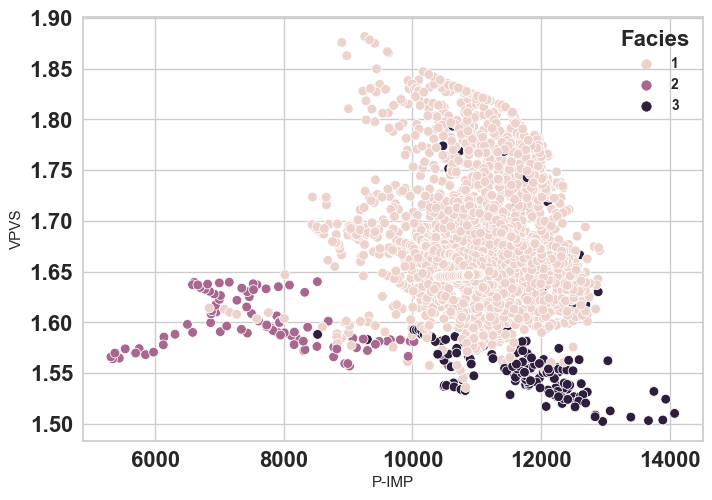

In [231]:
sns.scatterplot(data=data1,x="P-IMP",y="VPVS",hue="Facies")

## Target analysis

<AxesSubplot:xlabel='VPVS', ylabel='Count'>

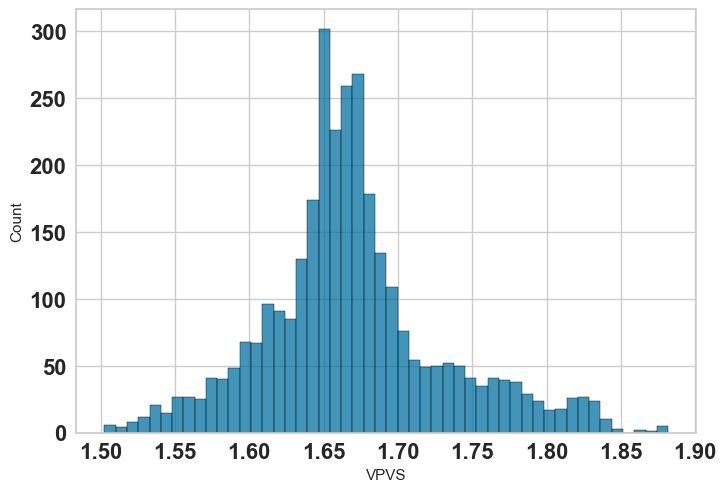

In [308]:
Target = "VPVS"
FEATURES = columns_names + ["P-IMP","S-IMP"]
sns.histplot(data1[Target])

<AxesSubplot:xlabel='VPVS', ylabel='Density'>

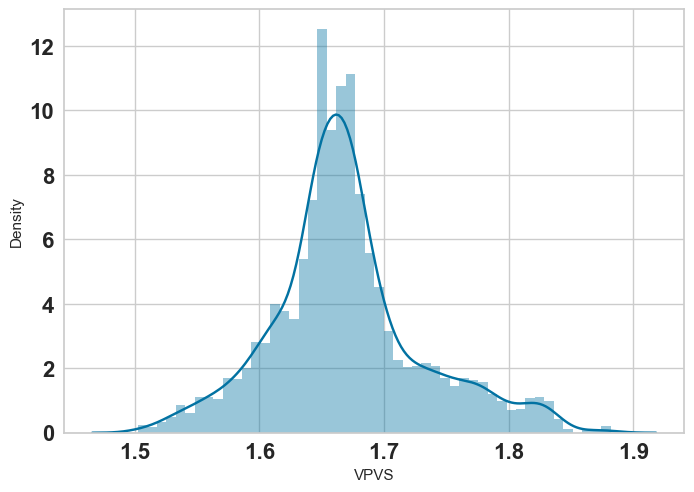

In [309]:
sns.distplot(data1[Target])

In [310]:
data = data1[FEATURES+[Target]]
data

,4R,5R,6R,7R,8R,9R,10R,11R,12R,13R,...,23R,24R,25R,26R,27R,28R,29R,P-IMP,S-IMP,VPVS
0,-135.431280,-380.009986,-1224.898187,-3644.941308,-7355.231098,-11344.753078,-15130.818055,-18095.357962,-20451.794961,-22233.927594,...,-11229.970029,-9394.772996,-7917.500338,-6247.704480,-5185.896824,-4298.673513,-3437.910302,11869.0391,7054.7998,1.682405
1,-136.886343,-385.774457,-1231.176007,-3661.962478,-7394.883551,-11407.151551,-15207.692463,-18178.717381,-20533.973154,-22311.320961,...,-11227.711443,-9391.506823,-7912.709186,-6241.981501,-5180.539001,-4294.691503,-3434.544526,11770.4014,6964.8838,1.689963
2,-138.335852,-391.516925,-1237.429865,-3678.918681,-7434.384658,-11469.311861,-15284.273457,-18261.758635,-20615.837690,-22388.418934,...,-11225.461477,-9388.253117,-7907.936321,-6236.280365,-5175.201627,-4290.724692,-3431.191597,11696.2441,6890.3013,1.697492
3,-139.785361,-397.259394,-1243.683724,-3695.874885,-7473.885766,-11531.472172,-15360.854451,-18344.799888,-20697.702227,-22465.516906,...,-11223.211512,-9384.999410,-7903.163455,-6230.579229,-5169.864254,-4286.757881,-3427.838668,11675.2432,6875.6411,1.698050
4,-141.234870,-403.001862,-1249.937583,-3712.831088,-7513.386873,-11593.632482,-15437.435445,-18427.841142,-20779.566763,-22542.614879,...,-11220.961547,-9381.745704,-7898.390590,-6224.878093,-5164.526880,-4282.791069,-3424.485738,11728.9717,6938.8008,1.690327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3180,-10.971019,-132.954831,-59.312120,-1129.695740,-3769.840570,-7116.604396,-10543.022066,-13228.963363,-14657.666383,-14411.120013,...,2100.024524,2251.412406,1899.386377,1719.723140,1376.877213,942.203311,611.906535,10870.1357,6601.1743,1.646697
3181,-11.521305,-130.922116,-65.824064,-1153.414307,-3794.327845,-7124.543369,-10528.234937,-13202.886626,-14631.559824,-14397.017930,...,2143.711598,2292.872631,1946.074121,1768.717258,1426.902315,991.220050,661.268922,10870.1357,6601.1743,1.646697
3182,-12.071591,-128.889401,-72.336007,-1177.132874,-3818.815121,-7132.482342,-10513.447807,-13176.809889,-14605.453265,-14382.915846,...,2187.398672,2334.332855,1992.761865,1817.711377,1476.927417,1040.236789,710.631308,10870.1357,6601.1743,1.646697
3183,-12.684766,-126.624376,-79.592173,-1203.562134,-3846.100942,-7141.328626,-10496.970719,-13147.752952,-14576.363099,-14367.202096,...,2236.078554,2380.531391,2044.785352,1872.304823,1532.669674,1094.855442,765.635110,10870.1357,6601.1743,1.646697


# Feature Scaling

In [311]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler
scaler = StandardScaler()
scaler.fit(data[FEATURES])
data[FEATURES] = scaler.transform(data[FEATURES])
data

,4R,5R,6R,7R,8R,9R,10R,11R,12R,13R,...,23R,24R,25R,26R,27R,28R,29R,P-IMP,S-IMP,VPVS
0,-0.269590,-0.472635,-0.948455,-1.629857,-1.928607,-2.004533,-2.010444,-1.938827,-1.864395,-1.817477,...,-1.057449,-0.905866,-0.779954,-0.634157,-0.534461,-0.445134,-0.354757,0.889953,0.713795,1.682405
1,-0.272164,-0.479281,-0.953126,-1.637390,-1.939038,-2.015641,-2.020711,-1.947756,-1.871855,-1.823778,...,-1.057250,-0.905576,-0.779524,-0.633634,-0.533962,-0.444755,-0.354425,0.790615,0.576197,1.689963
2,-0.274728,-0.485902,-0.957779,-1.644893,-1.949430,-2.026706,-2.030939,-1.956652,-1.879287,-1.830056,...,-1.057052,-0.905287,-0.779096,-0.633113,-0.533465,-0.444376,-0.354096,0.715931,0.462064,1.697492
3,-0.277292,-0.492523,-0.962433,-1.652397,-1.959822,-2.037771,-2.041167,-1.965548,-1.886719,-1.836333,...,-1.056854,-0.904998,-0.778668,-0.632592,-0.532968,-0.443998,-0.353766,0.694781,0.439629,1.698050
4,-0.279856,-0.499143,-0.967087,-1.659901,-1.970214,-2.048837,-2.051394,-1.974443,-1.894151,-1.842611,...,-1.056655,-0.904709,-0.778239,-0.632071,-0.532470,-0.443620,-0.353436,0.748891,0.536282,1.690327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3180,-0.049444,-0.187797,-0.081135,-0.516766,-0.985361,-1.251873,-1.397722,-1.417527,-1.338385,-1.180534,...,0.117288,0.128430,0.100911,0.094039,0.076908,0.054455,0.043626,-0.116044,0.019615,1.646697
3181,-0.050417,-0.185453,-0.085981,-0.527262,-0.991803,-1.253286,-1.395747,-1.414733,-1.336015,-1.179386,...,0.121138,0.132112,0.105100,0.098517,0.081568,0.059127,0.048482,-0.116044,0.019615,1.646697
3182,-0.051391,-0.183110,-0.090827,-0.537758,-0.998245,-1.254699,-1.393772,-1.411940,-1.333645,-1.178238,...,0.124988,0.135794,0.109290,0.102995,0.086228,0.063800,0.053338,-0.116044,0.019615,1.646697
3183,-0.052475,-0.180498,-0.096226,-0.549454,-1.005424,-1.256274,-1.391571,-1.408827,-1.331004,-1.176958,...,0.129278,0.139897,0.113958,0.107984,0.091421,0.069006,0.058749,-0.116044,0.019615,1.646697


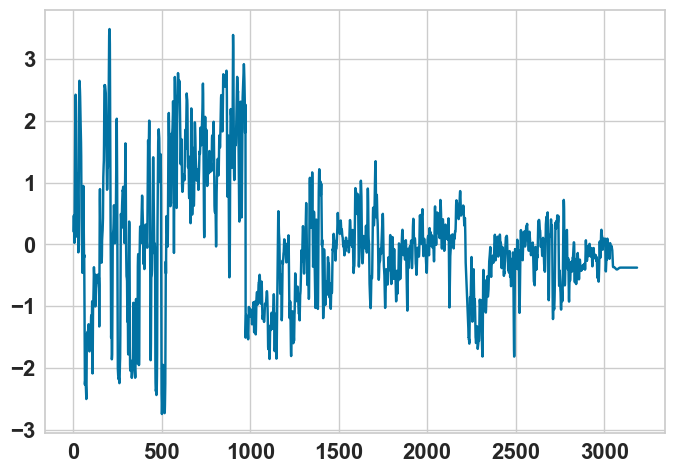

In [312]:
scaler1 = StandardScaler()
scaler1.fit(data[[Target]])
data[[Target]] = scaler1.transform(data[[Target]])
plt.plot(data[[Target]])

# Support Vector Regressor

In [313]:
from pycaret.regression import *

In [314]:
reg = setup(data =data,target=Target,remove_outliers=False,silent=True,train_size=0.65)
reg

,Description,Value
0,session_id,5394
1,Target,VPVS
2,Original Data,"(3171, 29)"
3,Missing Values,False
4,Numeric Features,28
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(2061, 25)"


('lightgbm',
 {'mae': <pycaret.containers.metrics.regression.MAEMetricContainer at 0x28e27988400>,
  'mse': <pycaret.containers.metrics.regression.MSEMetricContainer at 0x28e27988438>,
  'rmse': <pycaret.containers.metrics.regression.RMSEMetricContainer at 0x28e27988470>,
  'r2': <pycaret.containers.metrics.regression.R2MetricContainer at 0x28e279884a8>,
  'rmsle': <pycaret.containers.metrics.regression.RMSLEMetricContainer at 0x28e279884e0>,
  'mape': <pycaret.containers.metrics.regression.MAPEMetricContainer at 0x28e27988550>},
             4R        5R        6R        7R        8R        9R       10R  \
 0    -0.269590 -0.472635 -0.948455 -1.629857 -1.928607 -2.004533 -2.010444   
 1    -0.272164 -0.479281 -0.953126 -1.637390 -1.939038 -2.015641 -2.020711   
 2    -0.274728 -0.485902 -0.957779 -1.644893 -1.949430 -2.026706 -2.030939   
 3    -0.277292 -0.492523 -0.962433 -1.652397 -1.959822 -2.037771 -2.041167   
 4    -0.279856 -0.499143 -0.967086 -1.659901 -1.970214 -2.048837 -2.

In [315]:
c1 = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.0765,0.0156,0.1236,0.9846,0.0524,0.4237,0.0050
br,Bayesian Ridge,0.0762,0.0157,0.1241,0.9845,0.0519,0.4120,0.0060
ridge,Ridge Regression,0.0757,0.0162,0.1262,0.9839,0.0515,0.4399,0.0070
et,Extra Trees Regressor,0.0729,0.0159,0.1251,0.9838,0.0660,0.4732,0.1430
omp,Orthogonal Matching Pursuit,0.0767,0.0169,0.1284,0.9833,0.0513,0.4592,0.0050
huber,Huber Regressor,0.0652,0.0179,0.1321,0.9824,0.0467,0.2058,0.0180
lightgbm,Light Gradient Boosting Machine,0.0885,0.0216,0.1440,0.9785,0.0756,0.6274,0.0320
par,Passive Aggressive Regressor,0.1036,0.0231,0.1511,0.9767,0.0692,0.7076,0.0230
rf,Random Forest Regressor,0.0888,0.0256,0.1586,0.9742,0.0772,0.5486,0.2310
gbr,Gradient Boosting Regressor,0.1550,0.0510,0.2249,0.9488,0.1158,1.2110,0.1080


In [316]:
f = pull()
ff = f.index[0:3]
f.index = f["Model"]
d = f.drop(columns="Model")
d = d.round(2)
d = d.iloc[:-1]
d

,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
Model,,,,,,,
Linear Regression,0.08,0.02,0.12,0.98,0.05,0.42,0.00
Bayesian Ridge,0.08,0.02,0.12,0.98,0.05,0.41,0.01
Ridge Regression,0.08,0.02,0.13,0.98,0.05,0.44,0.01
Extra Trees Regressor,0.07,0.02,0.13,0.98,0.07,0.47,0.14
Orthogonal Matching Pursuit,0.08,0.02,0.13,0.98,0.05,0.46,0.00
Huber Regressor,0.07,0.02,0.13,0.98,0.05,0.21,0.02
Light Gradient Boosting Machine,0.09,0.02,0.14,0.98,0.08,0.63,0.03
Passive Aggressive Regressor,0.10,0.02,0.15,0.98,0.07,0.71,0.02
Random Forest Regressor,0.09,0.03,0.16,0.97,0.08,0.55,0.23


<AxesSubplot:ylabel='Model'>

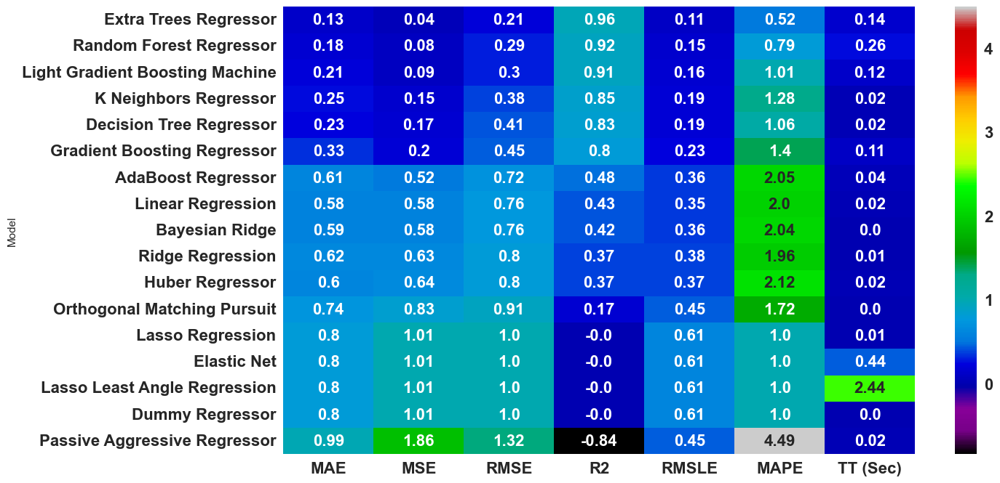

In [285]:
import matplotlib
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16)
font = {'size'   : 16,
        'weight' : 'bold'}
matplotlib.rc('font', **font)
zone_colours = ["blue","red"]
plt.figure(figsize=(14,8))
sns.heatmap(d,annot=True,fmt="0",cmap="nipy_spectral")

In [317]:
X1 = data[FEATURES]
Y1 = data[[Target]]
Y1

,VPVS
0,0.209728
1,0.333763
2,0.457337
3,0.466494
4,0.339741
...,...
3180,-0.376333
3181,-0.376333
3182,-0.376333
3183,-0.376333


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0705,0.0130,0.1140,0.9866,0.0646,0.4435
1,0.0748,0.0157,0.1254,0.9860,0.0619,0.2911
2,0.0706,0.0122,0.1103,0.9872,0.0570,0.3098
3,0.0683,0.0120,0.1094,0.9878,0.0569,0.2542
4,0.0765,0.0215,0.1467,0.9741,0.0768,0.7211
5,0.0643,0.0112,0.1057,0.9888,0.0591,0.5335
6,0.0696,0.0178,0.1333,0.9834,0.0644,0.9302
7,0.0771,0.0228,0.1509,0.9758,0.0796,0.3163
8,0.0797,0.0171,0.1308,0.9860,0.0670,0.4409


<AxesSubplot:ylabel='Fold'>

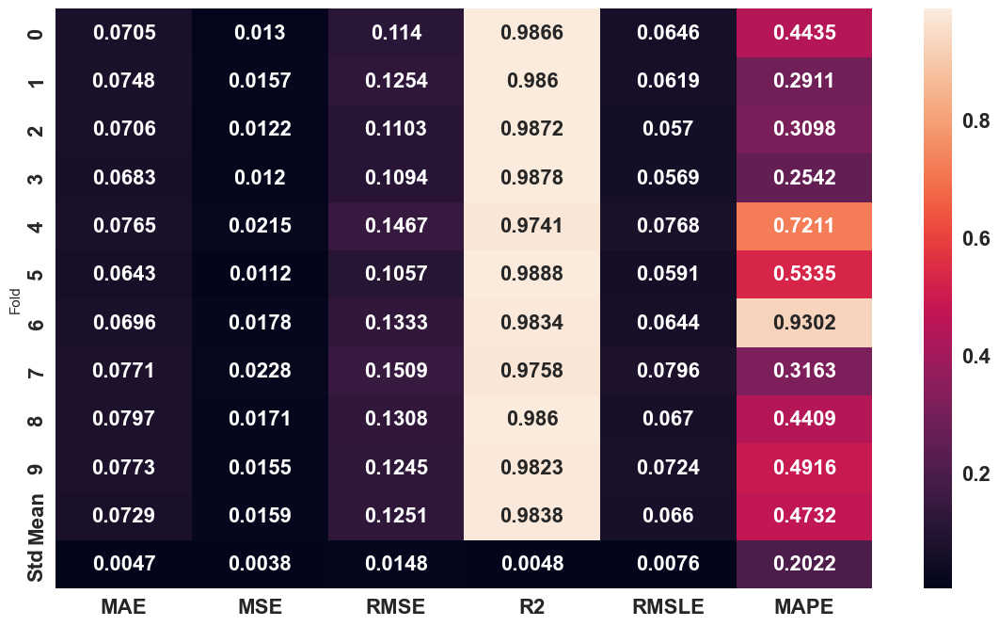

In [318]:
b = create_model("et")
b.fit(X1,Y1)
data[f"Predicted {Target}"] = b.predict(data[FEATURES])
k1 = pull()
plt.figure(figsize=(14,8))
sns.heatmap(k1,annot=True,fmt="1")

In [339]:
ff=["et","lr","ridge"]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0745,0.0149,0.1222,0.9846,0.0525,0.3904
1,0.0769,0.0225,0.1500,0.9800,0.0528,0.1891
2,0.0688,0.0118,0.1085,0.9876,0.0499,0.2943
3,0.0759,0.0163,0.1277,0.9834,0.0522,0.3842
4,0.0685,0.0096,0.0982,0.9884,0.0497,0.6472
5,0.0776,0.0160,0.1264,0.9840,0.0531,0.3394
6,0.0785,0.0144,0.1201,0.9865,0.0511,0.6654
7,0.0780,0.0194,0.1394,0.9793,0.0518,0.4436
8,0.0852,0.0247,0.1573,0.9798,0.0533,0.4072


0.9841884493658783


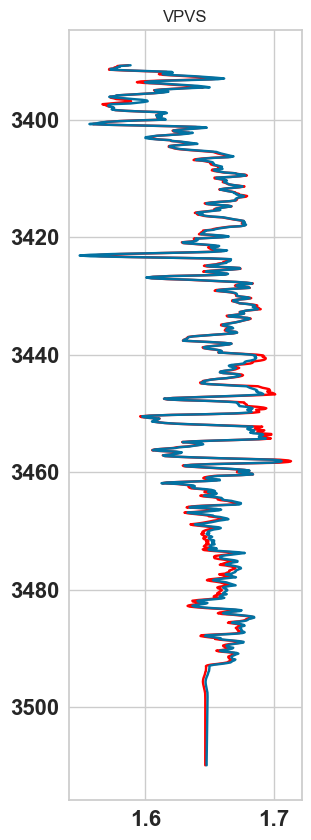

In [340]:
for kk in ff:
    for i in range(len(wells)):
        sample = wells[i].copy()
        sample["VPVS"]=sample["DT"]/sample["SDT"]
        sample[FEATURES] = scaler.transform(sample[FEATURES])
        lr = create_model(kk)
        ss = predict_model(lr,data=sample[FEATURES],)
        ak = scaler1.inverse_transform(ss[["Label"]])
        sample[f"{Target} Predicted"] = ak
        wells1 = wells.copy()
        wells1[i][f"Predicted {kk} {Target}"] = ak
        print(r2_score(sample[f"{Target}"],ak))
        plt.figure(figsize=(3,10))
        plt.plot(sample[Target],sample["DEPTH"],color="red",label=f"Actual {Target}")
        plt.plot(ak,sample["DEPTH"],label=f"Predicted {Target}")
        plt.gca().invert_yaxis()
        plt.title(Target)
        plt.show()

In [341]:
ff = ["et","lr","ridge"]

In [342]:
Target="VPVS"

In [356]:
number=3

In [357]:
wells1[number][Target] = wells1[number]["DT"]/wells1[number]["SDT"]

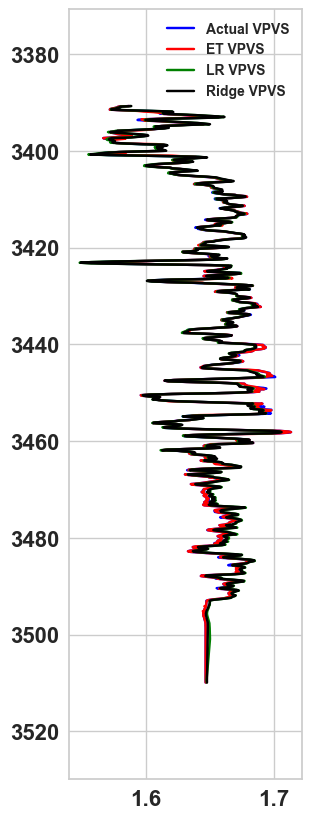

In [359]:
plt.figure(figsize=(3,10))
plt.plot(wells1[number][f"{Target}"],wells1[number]["DEPTH"],color="blue",label=f"Actual {Target}")
plt.plot(wells1[number][f"Predicted et {Target}"],wells1[number]["DEPTH"],color="red",label=f"ET {Target}")
plt.plot(wells1[number][f"Predicted lr {Target}"],wells1[number]["DEPTH"],color="green",label=f"LR {Target}")
plt.plot(wells1[number][f"Predicted ridge {Target}"],wells1[number]["DEPTH"],color="black",label=f"Ridge {Target}")
plt.legend(loc=1)
plt.ylim([wells1[number]["DEPTH"].min()-20,wells1[number]["DEPTH"].max()+20])
plt.gca().invert_yaxis()

In [227]:
wells = wells1

In [ ]:
from segysak.segy import segy_loader
import pywt

In [ ]:
# amplitude1 = segy_loader(r"D:\mubarak_project\mubarak.prj\seismic.dir\mubarak_new.sgy",iline=9,xline=13)
# seismic1 = amplitude1.to_dataframe().reset_index()
# seismic1 = seismic1[seismic1["data"]!=0]
# seismic1

In [ ]:
# seismic1 =seismic1[(seismic1["iline"]>=2250)&(seismic1["iline"]<=2871)]
# seismic1 = seismic1[(seismic1["xline"]>=2620)&(seismic1["xline"]<=2771)]
# seismic1

# Resampling Seismic

In [ ]:
# IL = [2456,2668,2310,2844]
# XL = [2674,2705,2693,2762]

In [ ]:
# COLS = list(columns)
# def ccwt(new):
#     new = new.reset_index(drop=True)
#     coef,freqs=pywt.cwt(new["data"],np.arange(4,30),'morl')
#     scalogram_real = coef.real.transpose()
 
#     wave = [scalogram_real]
#     wave = pd.DataFrame(np.concatenate(wave,axis=1),columns=COLS)
#     wave["twt"]  = new["twt"].values
#     wave["amp"] = new["data"]
#     wave["iline"] = new["iline"].iloc[0]
#     wave["xline"] = new["xline"].iloc[0]  
#     return wave

In [ ]:
# Good=[]
# for i in np.unique(seismic1.iline.values):
#     Good1=[]
#     bb = seismic1[seismic1["iline"]==i].copy()
#     print(np.unique(bb.iline)[0])
#     for j in np.unique(bb["xline"].unique()):
#         Good.append(ccwt(seismic1[(seismic1["iline"]==i)&(seismic1["xline"]==j)]))

In [12]:
freed = pd.concat(Good)

In [39]:
z2 = np.array(freed[COLS])

In [211]:
Good1 = pd.DataFrame(np.array(z2),columns=COLS)
Good1["P-IMP"] = segy_make_1["data"].values
Good1["S-IMP"] = segy_make_2["data"].values
Good1["VCL"] = segy_make_3["data"].values
Good1["PHIE"] = segy_make_4["data"].values
Good1["SW"] = segy_make_5["data"].values
# Good1["SW"] = segy_make_6["data"].values

In [213]:
scaled_data = scaler.transform(Good1[FEATURES])
predictions = b.predict_proba(scaled_data)


In [214]:
segy_make_7 = seismic1[["iline","xline","twt"]]
# segy_make_7["data"] = scaler1.inverse_transform(predictions.reshape(-1,1))
segy_make_7["data"]=predictions[:,1]

<AxesSubplot:xlabel='data', ylabel='Count'>

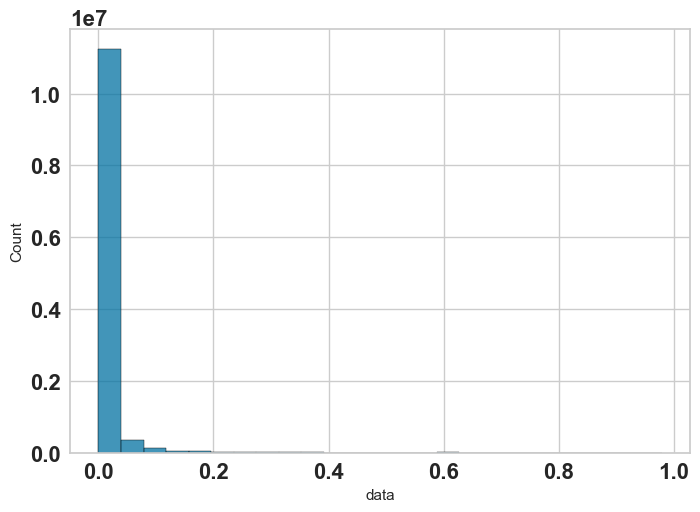

In [215]:
sns.histplot(segy_make_7["data"])

# Predicting Target

In [168]:
IL = [2456,2668,2310,2844]
XL = [2674,2705,2693,2762]
i=0

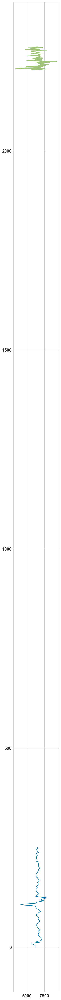

In [77]:
bbb = segy_make_2[(segy_make_2["iline"]==IL[i])&(segy_make_2["xline"]==XL[i])]
plt.figure(figsize=(3,65))
plt.plot(bbb["data"],bbb["twt"])
plt.plot(wells[i]["S-IMP"],wells[i]["DPTM"])

# Making SEGY

In [223]:
far = segy_make_7.set_index(["iline","xline","twt"])
far = far.to_xarray()
far["twt"] = far["twt"]
far

<xarray.Dataset>
Dimensions:  (iline: 622, xline: 152, twt: 126)
Coordinates:
  * iline    (iline) uint64 2250 2251 2252 2253 2254 ... 2868 2869 2870 2871
  * xline    (xline) uint64 2620 2621 2622 2623 2624 ... 2768 2769 2770 2771
  * twt      (twt) float64 0.0 2.0 4.0 6.0 8.0 ... 242.0 244.0 246.0 248.0 250.0
Data variables:
    data     (iline, xline, twt) float64 0.0 0.01 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [224]:
def SEIS(segy):
    SEGY = segy
    opt = dict(x="xline",y="twt",add_colorbar=True,robust=True,yincrease=False,cmap="jet",interpolation="spline36")
    inl_sel =IL
    f, ax = plt.subplots(nrows=len(inl_sel), figsize=(40, 40), sharey=True, constrained_layout=True)
    for i, val in enumerate(inl_sel):
        SEGY.data.sel(iline=val, twt=slice(0,250)).plot.imshow(ax=ax[i],**opt)
    return SEGY

<xarray.Dataset>
Dimensions:  (iline: 622, xline: 152, twt: 126)
Coordinates:
  * iline    (iline) uint64 2250 2251 2252 2253 2254 ... 2868 2869 2870 2871
  * xline    (xline) uint64 2620 2621 2622 2623 2624 ... 2768 2769 2770 2771
  * twt      (twt) float64 0.0 2.0 4.0 6.0 8.0 ... 242.0 244.0 246.0 248.0 250.0
Data variables:
    data     (iline, xline, twt) float64 0.0 0.01 0.0 0.0 ... 0.0 0.0 0.0 0.0

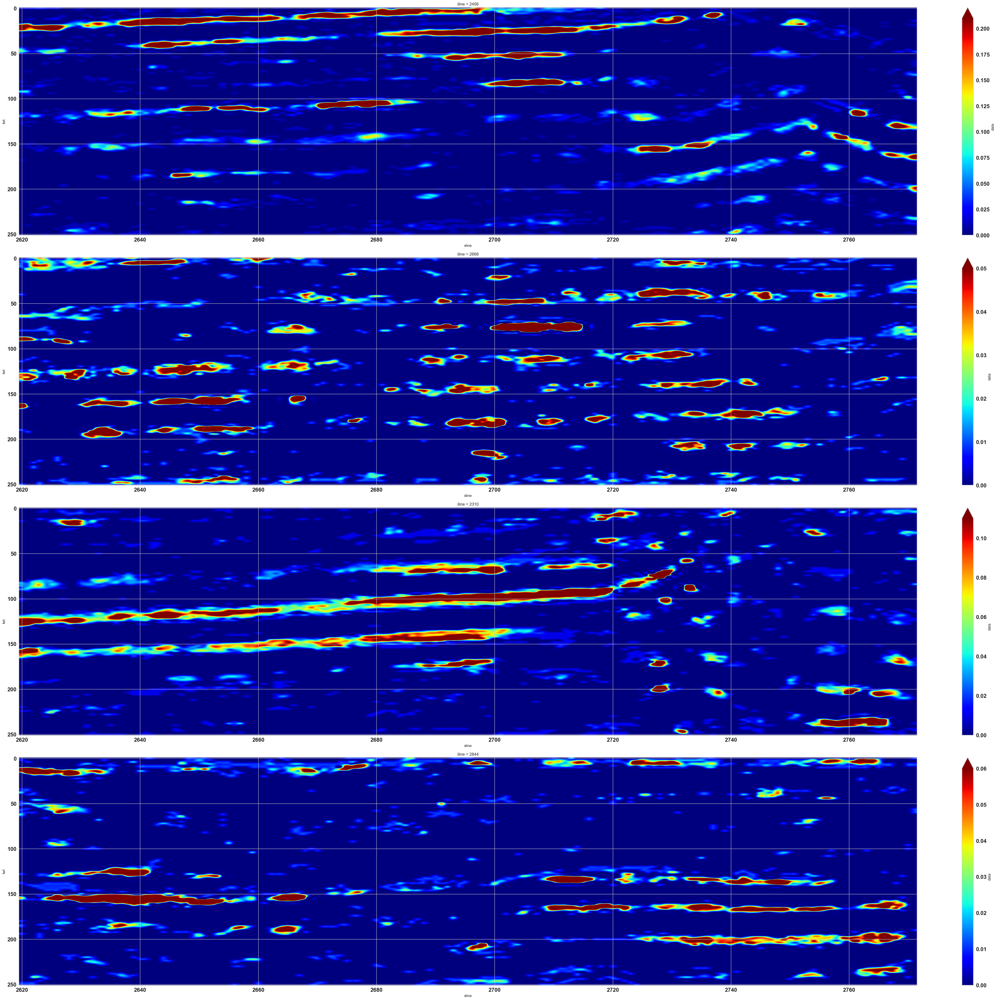

In [225]:
SEIS(far)

In [226]:
from segysak.segy import segy_writer

In [227]:
ff = amplitude1.attrs
ff["sample_rate"] = 2

In [228]:
far.attrs=ff

In [229]:
segy_writer(far,r"D:\Rehmat\volumesnew\FACIES-FINAL_1_2_2023_MUYYASSAR_check.segy")

Writing to SEG-Y:   0%|          | 0/94544 [00:00<?, ? traces/s]

In [96]:
data2 = pd.concat(wells)
data2

,DEPTH,PHIA,PHID,PHIE,PHIS,LRHO,MRHO,SW,GR,VCL,...,24R,25R,26R,27R,28R,29R,twt,Facies,Predicted P-IMP,NPHI
0,3346.0093,0.1321,0.0,0.0445,0.0989,41.3335,49.7703,0.6382,0.5765,0.5499,...,-8333.587700,-7504.031012,-6218.005653,-5561.465495,-5073.452029,-4148.325182,2205.193325,1,10868.982445,NaN
1,3346.1616,0.1346,0.0,0.0423,0.0987,41.5362,48.4107,0.6951,0.6734,0.5721,...,-8308.081375,-7485.000952,-6204.174688,-5546.037094,-5058.360776,-4135.822369,2205.245953,1,10868.982445,NaN
2,3346.3140,0.1350,0.0,0.0427,0.1068,41.9759,47.0926,0.7191,0.6185,0.5996,...,-8282.558303,-7465.958396,-6190.334641,-5530.598562,-5043.259615,-4123.311347,2205.298616,1,10868.982445,NaN
3,3346.4666,0.1374,0.0,0.0509,0.1226,41.5347,47.4679,0.6842,0.5676,0.5855,...,-8257.001736,-7446.890851,-6176.476431,-5515.139771,-5028.138636,-4110.783907,2205.351347,1,10868.982445,NaN
4,3346.6189,0.1377,0.0,0.0655,0.1397,40.5202,50.0445,0.6075,0.6317,0.5317,...,-8231.495412,-7427.860790,-6162.645465,-5499.711370,-5013.047384,-4098.281094,2205.403975,1,10867.339370,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,3424.5349,0.0798,NaN,0.0269,0.0798,32.5340,43.7127,0.5457,116.2696,0.6636,...,6625.999473,6244.499873,5673.169418,5518.154351,5154.566893,3805.138740,2315.871827,1,11466.564866,NaN
568,3424.6873,0.0797,NaN,0.0278,0.0797,32.5706,44.1830,0.5408,114.7774,0.6521,...,6940.987455,6517.715724,5996.357412,5828.713443,5446.568945,3980.480099,2316.114527,1,11403.812828,NaN
569,3424.8396,0.0791,NaN,0.0311,0.0791,32.6905,46.3000,0.5310,108.7892,0.6061,...,7239.328358,6776.492149,6302.464959,6122.859523,5723.138723,4146.554687,2316.344400,1,11490.397792,NaN
570,3424.9919,0.0742,NaN,0.0286,0.0742,33.1150,46.4400,0.5568,109.8837,0.6145,...,7522.596908,7022.195041,6593.107776,6402.145173,5985.736036,4304.239091,2316.562660,1,11453.571967,NaN


In [98]:
AA = wells[0]
AA

,DEPTH,PHIA,PHID,PHIE,PHIS,LRHO,MRHO,SW,GR,VCL,...,23R,24R,25R,26R,27R,28R,29R,twt,Facies,Predicted P-IMP
0,3346.0093,0.1321,0.0,0.0445,0.0989,41.3335,49.7703,0.6382,0.5765,0.5499,...,-9748.927224,-8333.587700,-7504.031012,-6218.005653,-5561.465495,-5073.452029,-4148.325182,2205.193325,1,10868.982445
1,3346.1616,0.1346,0.0,0.0423,0.0987,41.5362,48.4107,0.6951,0.6734,0.5721,...,-9712.357959,-8308.081375,-7485.000952,-6204.174688,-5546.037094,-5058.360776,-4135.822369,2205.245953,1,10868.982445
2,3346.3140,0.1350,0.0,0.0427,0.1068,41.9759,47.0926,0.7191,0.6185,0.5996,...,-9675.764683,-8282.558303,-7465.958396,-6190.334641,-5530.598562,-5043.259615,-4123.311347,2205.298616,1,10868.982445
3,3346.4666,0.1374,0.0,0.0509,0.1226,41.5347,47.4679,0.6842,0.5676,0.5855,...,-9639.123384,-8257.001736,-7446.890851,-6176.476431,-5515.139771,-5028.138636,-4110.783907,2205.351347,1,10868.982445
4,3346.6189,0.1377,0.0,0.0655,0.1397,40.5202,50.0445,0.6075,0.6317,0.5317,...,-9602.554119,-8231.495412,-7427.860790,-6162.645465,-5499.711370,-5013.047384,-4098.281094,2205.403975,1,10867.339370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1169,3524.1648,0.1074,0.0,0.0554,0.0897,48.0100,38.2719,0.5305,0.9369,0.9369,...,5180.463702,5184.625681,5360.889741,5323.154795,5407.867021,5362.860896,4962.263761,2299.645328,1,11241.313601
1170,3524.3171,0.1081,0.0,0.0553,0.0896,47.5084,39.8895,0.5549,0.8787,0.8786,...,5202.269750,5192.497786,5359.801103,5320.260076,5405.453720,5361.169724,4959.437354,2299.730610,1,11334.940351
1171,3524.4697,0.1064,0.0,0.0553,0.0896,46.9553,42.6774,0.5817,0.7968,0.7967,...,5224.118752,5200.385398,5358.710321,5317.359654,5403.035666,5359.475221,4956.605380,2299.816060,1,11517.030357
1172,3524.6221,0.0993,0.0,0.0553,0.0896,47.3029,44.4409,0.6101,0.7680,0.7680,...,5245.939117,5208.262671,5357.620968,5314.463034,5400.620781,5357.782939,4953.777118,2299.901398,1,11509.971637


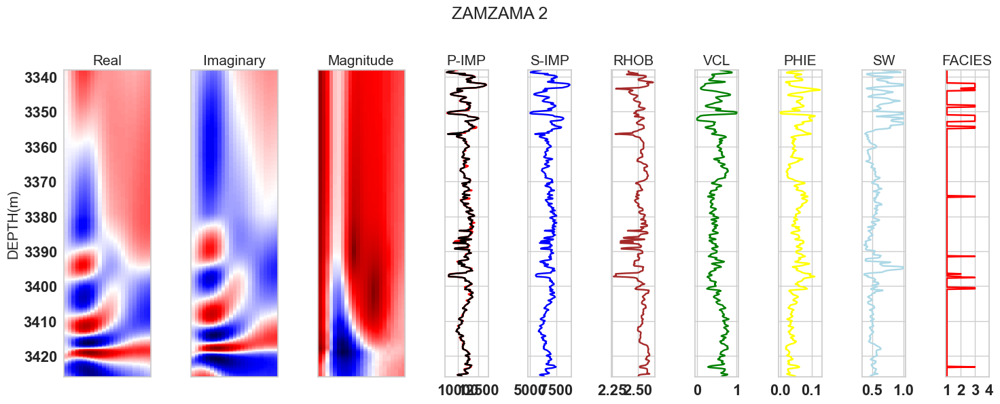

In [108]:
fig,ax = plt.subplots(nrows=1,ncols=10,figsize=(15,6),gridspec_kw={'width_ratios': [4,4,4,2,2,2,2,2,2,2]},sharey=True)



ax[0].matshow(AA[columns],cmap="seismic_r",aspect="auto",extent = [0,45-10,AA["DEPTH"].max(),AA["DEPTH"].min()]) 
ax[1].matshow(AA[columns1],cmap="seismic_r",aspect="auto",extent = [0,45-10,AA["DEPTH"].max(),AA["DEPTH"].min()])
ax[2].matshow(AA[columns2],cmap="seismic_r",aspect="auto",extent = [0,45-10,AA["DEPTH"].max(),AA["DEPTH"].min()])
ax[3].plot(AA["P-IMP"],AA["DEPTH"],color="red")
ax[3].plot(AA["Predicted 2 P-IMP"],AA["DEPTH"],color="black")
ax[4].plot(AA["S-IMP"],AA["DEPTH"],color="blue")
ax[5].plot(AA["RHOB"],AA["DEPTH"],color="brown")
ax[6].plot(AA["VCL"],AA["DEPTH"],color="green")
ax[7].plot(AA["PHIE"],AA["DEPTH"],color="yellow")
ax[8].plot(AA["SW"],AA["DEPTH"],color="lightblue")


ax[9].plot(AA["Facies"],AA["DEPTH"],color="red")
ax[9].set_xticks([1,2,3,4])

ax[0].set_title("Real",fontsize=15)


ax[1].set_title("Imaginary",fontsize=15)
ax[2].set_title("Magnitude",fontsize=15)

ax[3].set_title("P-IMP",fontsize=15)
ax[4].set_title("S-IMP",fontsize=15)
ax[5].set_title("RHOB",fontsize=15)
ax[6].set_title("VCL",fontsize=15)
ax[7].set_title("PHIE",fontsize=15)
ax[8].set_title("SW",fontsize=15)
ax[9].set_title("FACIES",fontsize=15)

ax[0].set_xticks([])
ax[1].set_xticks([])
ax[2].set_xticks([])
ax[0].set_ylabel("DEPTH(m)",fontsize=15)
ax[0].grid(False)
ax[1].grid(False)
ax[2].grid(False)
plt.suptitle("ZAMZAMA 2", y=1, fontsize=18)
plt.tight_layout()
plt.show()

In [109]:
Target = "S-IMP"
FEATURES = columns_names+ ["Predicted 2 P-IMP"]

<AxesSubplot:xlabel='S-IMP', ylabel='Count'>

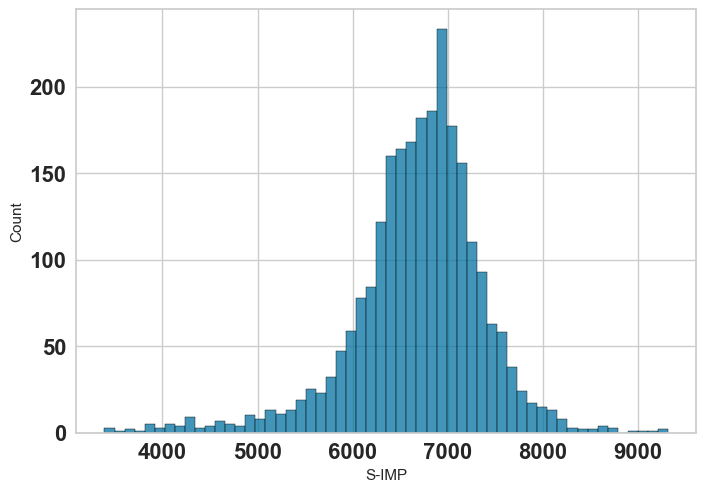

In [110]:
sns.histplot(data=data2,x="S-IMP")

In [111]:
Finalized = data2[FEATURES+[Target]]
scaler = MinMaxScaler()
scaler.fit(Finalized[FEATURES])
Finalized[FEATURES] = scaler.transform(Finalized[FEATURES])


scaler1 = MinMaxScaler()
scaler1.fit(Finalized[[Target]])
Finalized[[Target]]= scaler1.transform(Finalized[[Target]])

In [112]:
X = Finalized[FEATURES]
Y = Finalized[Target]

In [113]:
features = Finalized[FEATURES+[Target]]
features

,7R,8R,9R,10R,11R,12R,13R,14R,15R,16R,...,22M,23M,24M,25M,26M,27M,28M,29M,Predicted 2 P-IMP,S-IMP
0,0.016764,0.021549,0.023561,0.022268,0.019500,0.048168,0.059538,0.058529,0.053158,0.053438,...,0.264689,0.167475,0.115748,0.049125,0.040148,0.019519,0.020366,0.042036,0.748354,0.618132
1,0.015647,0.020114,0.021991,0.020784,0.018201,0.047111,0.058696,0.057952,0.052859,0.053474,...,0.264696,0.167470,0.115725,0.049088,0.040128,0.019510,0.020348,0.042024,0.736207,0.601752
2,0.014530,0.018677,0.020421,0.019300,0.016901,0.046053,0.057853,0.057374,0.052560,0.053509,...,0.264703,0.167466,0.115703,0.049050,0.040107,0.019501,0.020330,0.042012,0.725525,0.585681
3,0.013411,0.017238,0.018848,0.017813,0.015599,0.044994,0.057009,0.056796,0.052260,0.053545,...,0.264711,0.167461,0.115680,0.049013,0.040086,0.019492,0.020311,0.042000,0.738220,0.590260
4,0.012294,0.015803,0.017278,0.016330,0.014300,0.043937,0.056167,0.056218,0.051961,0.053580,...,0.264718,0.167457,0.115658,0.048975,0.040066,0.019483,0.020293,0.041988,0.747042,0.621312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573,0.792780,0.825726,0.867184,0.891912,0.889082,0.891390,0.909036,0.929847,0.928329,0.922675,...,0.456239,0.413755,0.409810,0.393179,0.417380,0.457444,0.485304,0.522305,0.525335,0.427339
574,0.774213,0.810117,0.853645,0.881139,0.880624,0.886433,0.906343,0.929363,0.930421,0.926477,...,0.456816,0.412660,0.408161,0.392373,0.416866,0.456331,0.485273,0.522184,0.556026,0.463143
575,0.754918,0.793896,0.839575,0.869943,0.871834,0.881281,0.903544,0.928860,0.932594,0.930428,...,0.457415,0.411522,0.406446,0.391534,0.416331,0.455173,0.485240,0.522059,0.580126,0.491481
576,0.737681,0.779406,0.827005,0.859941,0.863981,0.876679,0.901044,0.928411,0.934536,0.933957,...,0.457950,0.410505,0.404914,0.390785,0.415854,0.454140,0.485211,0.521946,0.588638,0.501585


In [114]:
# from pycaret.classification import *
from pycaret.regression import *

In [115]:
reg = setup(data =features,target=Target,remove_outliers=False,silent=True,train_size=0.75,remove_perfect_collinearity=False)
reg

,Description,Value
0,session_id,4450
1,Target,S-IMP
2,Original Data,"(2484, 71)"
3,Missing Values,False
4,Numeric Features,70
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1863, 70)"


(False,
 [('Setup Config',
                                  Description             Value
   0                               session_id              4450
   1                                   Target             S-IMP
   2                            Original Data        (2484, 71)
   3                           Missing Values             False
   4                         Numeric Features                70
   5                     Categorical Features                 0
   6                         Ordinal Features             False
   7                High Cardinality Features             False
   8                  High Cardinality Method              None
   9                    Transformed Train Set        (1863, 70)
   10                    Transformed Test Set         (621, 70)
   11                      Shuffle Train-Test              True
   12                     Stratify Train-Test             False
   13                          Fold Generator             KFold
   14        

In [116]:
c1 = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.0147,0.0005,0.0221,0.9636,0.0147,0.0331,0.2250
et,Extra Trees Regressor,0.0145,0.0005,0.0226,0.9619,0.0150,0.0291,0.3480
rf,Random Forest Regressor,0.0165,0.0006,0.0250,0.9527,0.0165,0.0335,0.7130
gbr,Gradient Boosting Regressor,0.0186,0.0007,0.0259,0.9501,0.0169,0.0392,0.3530
dt,Decision Tree Regressor,0.0221,0.0011,0.0333,0.9170,0.0218,0.0453,0.0230
lr,Linear Regression,0.0246,0.0012,0.0349,0.9095,0.0227,0.0568,0.4920
br,Bayesian Ridge,0.0249,0.0013,0.0354,0.9071,0.0231,0.0583,0.0110
ridge,Ridge Regression,0.0259,0.0014,0.0369,0.8991,0.0238,0.0561,0.0100
huber,Huber Regressor,0.0256,0.0014,0.0373,0.8971,0.0240,0.0558,0.0250
omp,Orthogonal Matching Pursuit,0.0275,0.0015,0.0383,0.8921,0.0249,0.0644,0.0100


In [117]:
d = pull()
d

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,1.470000e-02,5.000000e-04,2.210000e-02,9.636000e-01,0.0147,3.310000e-02,0.225
et,Extra Trees Regressor,1.450000e-02,5.000000e-04,2.260000e-02,9.619000e-01,0.0150,2.910000e-02,0.348
rf,Random Forest Regressor,1.650000e-02,6.000000e-04,2.500000e-02,9.527000e-01,0.0165,3.350000e-02,0.713
gbr,Gradient Boosting Regressor,1.860000e-02,7.000000e-04,2.590000e-02,9.501000e-01,0.0169,3.920000e-02,0.353
dt,Decision Tree Regressor,2.210000e-02,1.100000e-03,3.330000e-02,9.170000e-01,0.0218,4.530000e-02,0.023
lr,Linear Regression,2.460000e-02,1.200000e-03,3.490000e-02,9.095000e-01,0.0227,5.680000e-02,0.492
br,Bayesian Ridge,2.490000e-02,1.300000e-03,3.540000e-02,9.071000e-01,0.0231,5.830000e-02,0.011
ridge,Ridge Regression,2.590000e-02,1.400000e-03,3.690000e-02,8.991000e-01,0.0238,5.610000e-02,0.010
huber,Huber Regressor,2.560000e-02,1.400000e-03,3.730000e-02,8.971000e-01,0.0240,5.580000e-02,0.025
omp,Orthogonal Matching Pursuit,2.750000e-02,1.500000e-03,3.830000e-02,8.921000e-01,0.0249,6.440000e-02,0.010


In [118]:
d.index = d["Model"]
d = d.drop(columns="Model")
d = d.round(2)
d = d.iloc[:-1]
d

,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
Model,,,,,,,
Light Gradient Boosting Machine,0.01,0.00,0.02,0.96,0.01,0.03,0.22
Extra Trees Regressor,0.01,0.00,0.02,0.96,0.02,0.03,0.35
Random Forest Regressor,0.02,0.00,0.02,0.95,0.02,0.03,0.71
Gradient Boosting Regressor,0.02,0.00,0.03,0.95,0.02,0.04,0.35
Decision Tree Regressor,0.02,0.00,0.03,0.92,0.02,0.05,0.02
Linear Regression,0.02,0.00,0.03,0.91,0.02,0.06,0.49
Bayesian Ridge,0.02,0.00,0.04,0.91,0.02,0.06,0.01
Ridge Regression,0.03,0.00,0.04,0.90,0.02,0.06,0.01
Huber Regressor,0.03,0.00,0.04,0.90,0.02,0.06,0.02


<AxesSubplot:ylabel='Model'>

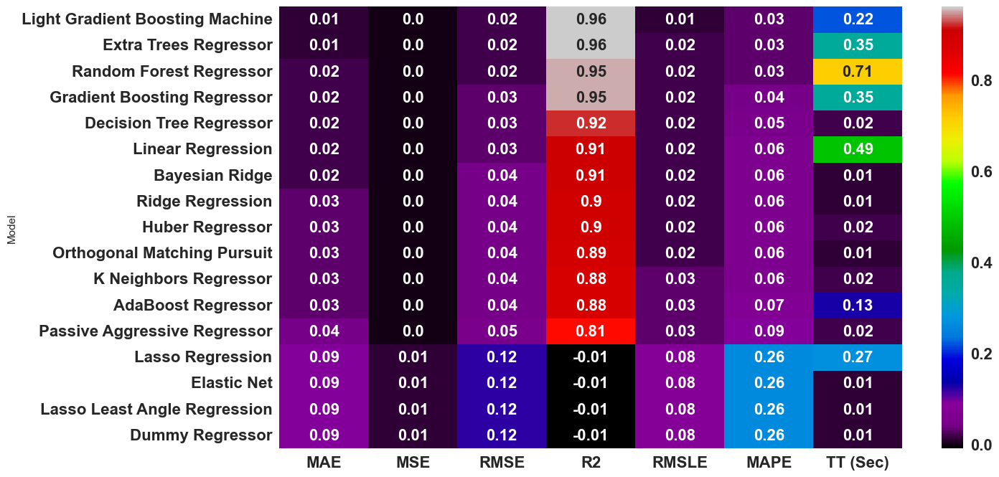

In [119]:
import matplotlib
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16)
font = {'size'   : 16,
        'weight' : 'bold'}
matplotlib.rc('font', **font)
zone_colours = ["blue","red"]
plt.figure(figsize=(14,8))
sns.heatmap(d,annot=True,fmt="0",cmap="nipy_spectral")

In [120]:
X1 = Finalized[FEATURES]
Y1 = Finalized[[Target]]
X1

,7R,8R,9R,10R,11R,12R,13R,14R,15R,16R,...,21M,22M,23M,24M,25M,26M,27M,28M,29M,Predicted 2 P-IMP
0,0.016764,0.021549,0.023561,0.022268,0.019500,0.048168,0.059538,0.058529,0.053158,0.053438,...,0.335996,0.264689,0.167475,0.115748,0.049125,0.040148,0.019519,0.020366,0.042036,0.748354
1,0.015647,0.020114,0.021991,0.020784,0.018201,0.047111,0.058696,0.057952,0.052859,0.053474,...,0.336016,0.264696,0.167470,0.115725,0.049088,0.040128,0.019510,0.020348,0.042024,0.736207
2,0.014530,0.018677,0.020421,0.019300,0.016901,0.046053,0.057853,0.057374,0.052560,0.053509,...,0.336037,0.264703,0.167466,0.115703,0.049050,0.040107,0.019501,0.020330,0.042012,0.725525
3,0.013411,0.017238,0.018848,0.017813,0.015599,0.044994,0.057009,0.056796,0.052260,0.053545,...,0.336058,0.264711,0.167461,0.115680,0.049013,0.040086,0.019492,0.020311,0.042000,0.738220
4,0.012294,0.015803,0.017278,0.016330,0.014300,0.043937,0.056167,0.056218,0.051961,0.053580,...,0.336079,0.264718,0.167457,0.115658,0.048975,0.040066,0.019483,0.020293,0.041988,0.747042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573,0.792780,0.825726,0.867184,0.891912,0.889082,0.891390,0.909036,0.929847,0.928329,0.922675,...,0.489112,0.456239,0.413755,0.409810,0.393179,0.417380,0.457444,0.485304,0.522305,0.525335
574,0.774213,0.810117,0.853645,0.881139,0.880624,0.886433,0.906343,0.929363,0.930421,0.926477,...,0.488527,0.456816,0.412660,0.408161,0.392373,0.416866,0.456331,0.485273,0.522184,0.556026
575,0.754918,0.793896,0.839575,0.869943,0.871834,0.881281,0.903544,0.928860,0.932594,0.930428,...,0.487918,0.457415,0.411522,0.406446,0.391534,0.416331,0.455173,0.485240,0.522059,0.580126
576,0.737681,0.779406,0.827005,0.859941,0.863981,0.876679,0.901044,0.928411,0.934536,0.933957,...,0.487375,0.457950,0.410505,0.404914,0.390785,0.415854,0.454140,0.485211,0.521946,0.588638


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0146,0.0005,0.0230,0.9607,0.0151,0.0288
1,0.0159,0.0006,0.0250,0.9485,0.0164,0.0314
2,0.0154,0.0006,0.0250,0.9576,0.0164,0.0327
3,0.0148,0.0005,0.0234,0.9620,0.0159,0.0305
4,0.0151,0.0006,0.0240,0.9524,0.0163,0.0307
5,0.0144,0.0005,0.0217,0.9691,0.0137,0.0272
6,0.0126,0.0004,0.0189,0.9738,0.0124,0.0243
7,0.0136,0.0005,0.0218,0.9691,0.0150,0.0295
8,0.0151,0.0005,0.0230,0.9694,0.0152,0.0303


<AxesSubplot:ylabel='Fold'>

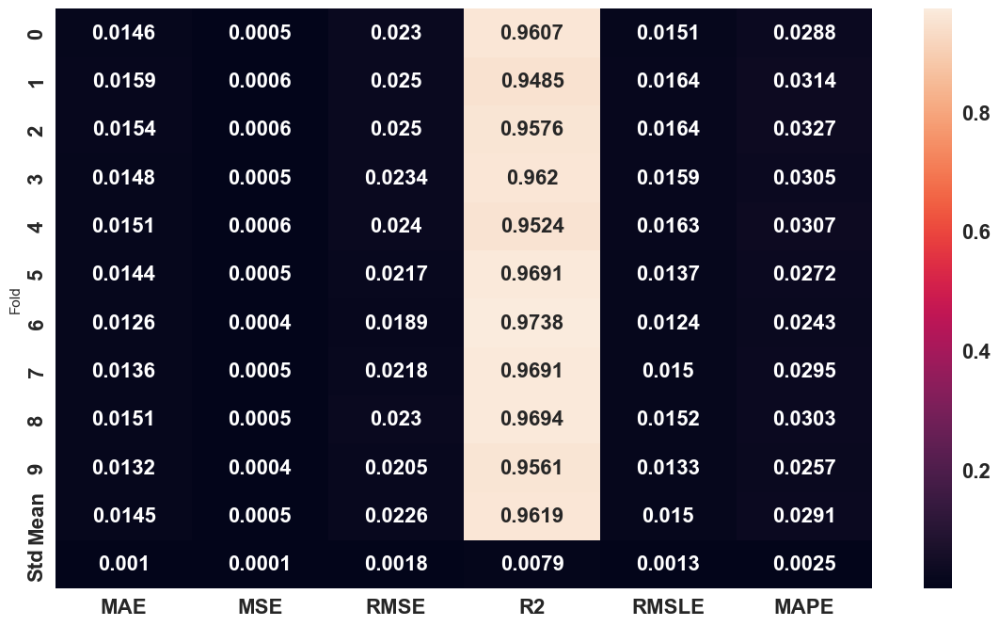

In [121]:
b = create_model("et")
b.fit(X1,Y1)
data2[f"Predicted {Target}"] = b.predict(data2[FEATURES])
k1 = pull()
plt.figure(figsize=(14,8))
sns.heatmap(k1,annot=True,fmt="1")

In [122]:
from sklearn.metrics import r2_score

0.9831896686452669


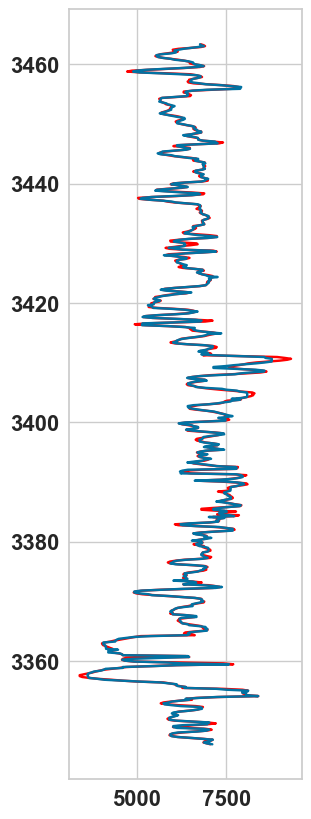

0.9817011427341539


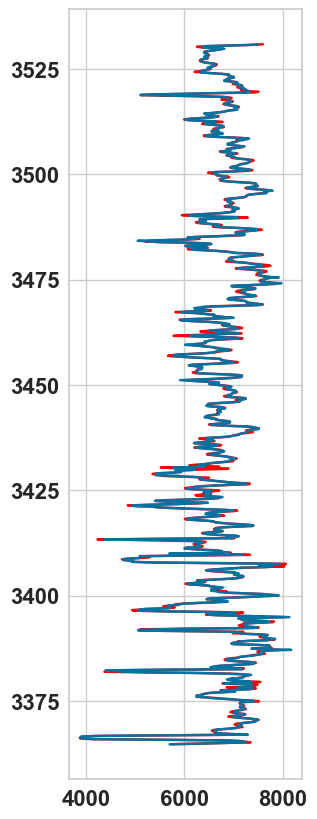

0.9591787413586603


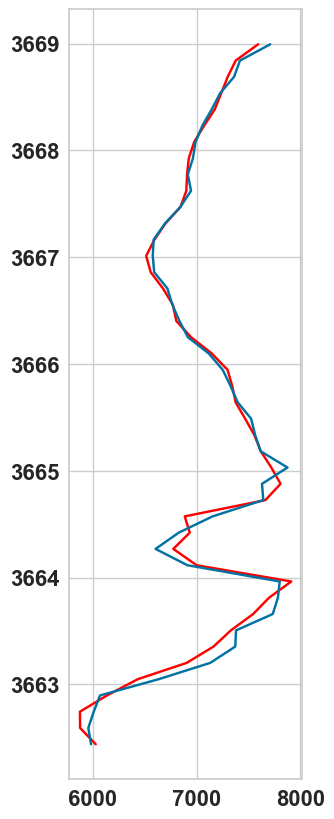

0.9786373852371809


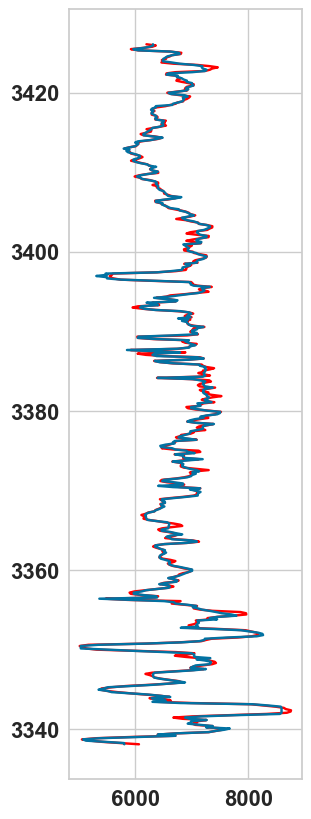

In [124]:
for i in range(len(wells)):
    sample = wells[i].copy()
    sample[FEATURES] = scaler.transform(sample[FEATURES])
    ss = predict_model(c1,data=sample[FEATURES])
    ak = scaler1.inverse_transform(ss[["Label"]])
    sample[f"{Target} Predicted"] = ak
    wells[i][f"Predicted 2 {Target}"] = ak
    print(r2_score(sample[f"{Target}"],ak))
    plt.figure(figsize=(3,10))
    plt.plot(sample[Target],sample["DEPTH"],color="red")
    plt.plot(ak,sample["DEPTH"])
    plt.show()

In [127]:
Good1 = pd.concat(Good)
Good1["Predicted 2 P-IMP"] = segy_make_1["data"]
scaled_data = scaler.transform(Good1[FEATURES])
predictions = b.predict(scaled_data)
segy_make_2 = Good1[["iline","xline","twt"]]
segy_make_2["data"] = scaler1.inverse_transform(predictions.reshape(-1,1))

In [128]:
segy_make_2

,iline,xline,twt,data
0,2250,2620,2218.0,6275.517028
1,2250,2620,2220.0,6490.388978
2,2250,2620,2222.0,6583.159700
3,2250,2620,2224.0,6549.147699
4,2250,2620,2226.0,6568.882815
...,...,...,...,...
68,2871,2771,2338.0,6331.580566
69,2871,2771,2340.0,6359.500329
70,2871,2771,2342.0,6422.072289
71,2871,2771,2344.0,6486.610299


In [130]:
i=2

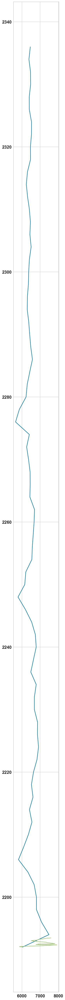

In [134]:
bbb = segy_make_2[(segy_make_2["iline"]==IL[i])&(segy_make_2["xline"]==XL[i])]
plt.figure(figsize=(3,65))
plt.plot(bbb["data"],bbb["twt"])
plt.plot(wells[i]["S-IMP"],wells[i]["DPTM"])

In [135]:
far = segy_make_2.set_index(["iline","xline","twt"])
far = far.to_xarray()
far["twt"] = far["twt"]
far

<xarray.Dataset>
Dimensions:  (iline: 622, xline: 152, twt: 114)
Coordinates:
  * iline    (iline) uint64 2250 2251 2252 2253 2254 ... 2868 2869 2870 2871
  * xline    (xline) uint64 2620 2621 2622 2623 2624 ... 2768 2769 2770 2771
  * twt      (twt) float64 2.152e+03 2.154e+03 2.156e+03 ... 2.376e+03 2.378e+03
Data variables:
    data     (iline, xline, twt) float64 nan nan nan nan nan ... nan nan nan nan

Writing to SEG-Y:   0%|          | 0/94544 [00:00<?, ? traces/s]

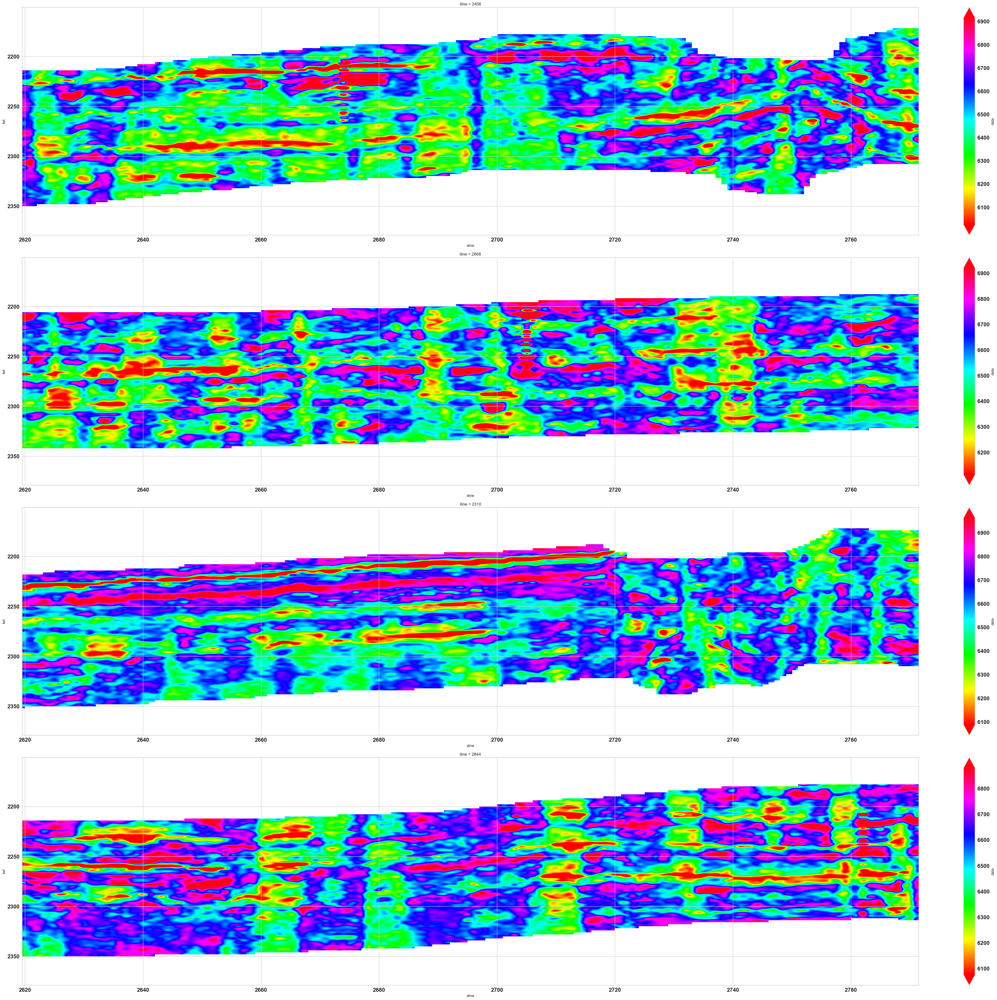

In [136]:
SEIS(far)
ff = amplitude1.attrs
ff["sample_rate"] = 2
far.attrs=ff
segy_writer(far,r"D:\Rehmat\Volumes\S-IMP-2.segy")

In [137]:

for j,i in enumerate(wells):
    i.to_csv(f"D:\Rehmat\wells\_{j}.csv",index=False)

In [138]:
wells[0]

,DEPTH,PHIA,PHID,PHIE,PHIS,LRHO,MRHO,SW,GR,VCL,...,24M,25M,26M,27M,28M,29M,Facies,Predicted 2 P-IMP,Predicted S-IMP,Predicted 2 S-IMP
0,3346.0093,0.1321,0.0000,0.0445,0.0989,41.3335,49.7703,0.6382,0.5765,0.5499,...,5549.613509,4479.383368,4135.960649,3403.022075,2802.916254,2462.567425,1,11869.038912,0.798058,7110.355870
1,3346.1616,0.1346,0.0000,0.0423,0.0987,41.5362,48.4107,0.6951,0.6734,0.5721,...,5549.215200,4478.761505,4135.641090,3402.889611,2802.652599,2462.396166,1,11762.494198,0.798058,6952.713686
2,3346.3140,0.1350,0.0000,0.0427,0.1068,41.9759,47.0926,0.7191,0.6185,0.5996,...,5548.816630,4478.139235,4135.321321,3402.757061,2802.388772,2462.224793,1,11668.793114,0.798058,6873.664214
3,3346.4666,0.1374,0.0000,0.0509,0.1226,41.5347,47.4679,0.6842,0.5676,0.5855,...,5548.417537,4477.516148,4135.001133,3402.624337,2802.124598,2462.053196,1,11780.149138,0.798058,7037.101941
4,3346.6189,0.1377,0.0000,0.0655,0.1397,40.5202,50.0445,0.6075,0.6317,0.5317,...,5548.019229,4476.894285,4134.681574,3402.491874,2801.860943,2461.881936,1,11857.532137,0.798058,7041.304621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
766,3462.7476,0.1327,0.1110,0.0289,0.1056,43.8588,42.3354,0.7163,0.5805,0.7242,...,3505.052943,3824.794004,3517.759272,3351.449956,3050.901632,2586.467746,1,11335.646656,0.747009,6506.860882
767,3462.9001,0.1257,0.0997,0.0327,0.0926,43.4539,46.1522,0.6951,0.5493,0.6460,...,3501.604450,3821.029533,3519.096444,3354.233442,3051.072146,2585.341536,1,11519.900955,0.747009,6713.691497
768,3463.0525,0.1336,0.1186,0.0331,0.0808,41.9226,47.7075,0.7189,0.5416,0.5897,...,3498.158219,3817.267531,3520.432738,3357.015103,3051.242549,2584.216064,1,11719.049837,0.747245,6877.324414
769,3463.2048,0.1490,0.1467,0.0324,0.0742,40.2383,47.1168,0.7428,0.6775,0.5642,...,3494.714249,3813.507996,3521.768156,3359.794938,3051.412840,2583.091331,1,11596.009588,0.747245,6793.480765
